In [ ]:
import pandas as pd

df = pd.read_csv('data.csv')
df['Data'] = pd.to_datetime(df['Data'], format='%m/%d/%Y')


/var/folders/7h/jc05106n7tq7k1df0p1yfjr40000gn/T/ipykernel_10575/2990941733.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  shop_data['Data'] = (pd.to_datetime(shop_data['Data']) - pd.to_datetime(min(df['Data']))).dt.days
/var/folders/7h/jc05106n7tq7k1df0p1yfjr40000gn/T/ipykernel_10575/2990941733.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  shop_data['Data'] = (pd.to_datetime(shop_data['Data']) - pd.to_datetime(min(df['Data']))).dt.days
/var/folders/7h/jc05106n7tq7k1df0p1yfjr40000gn/T/ipykernel

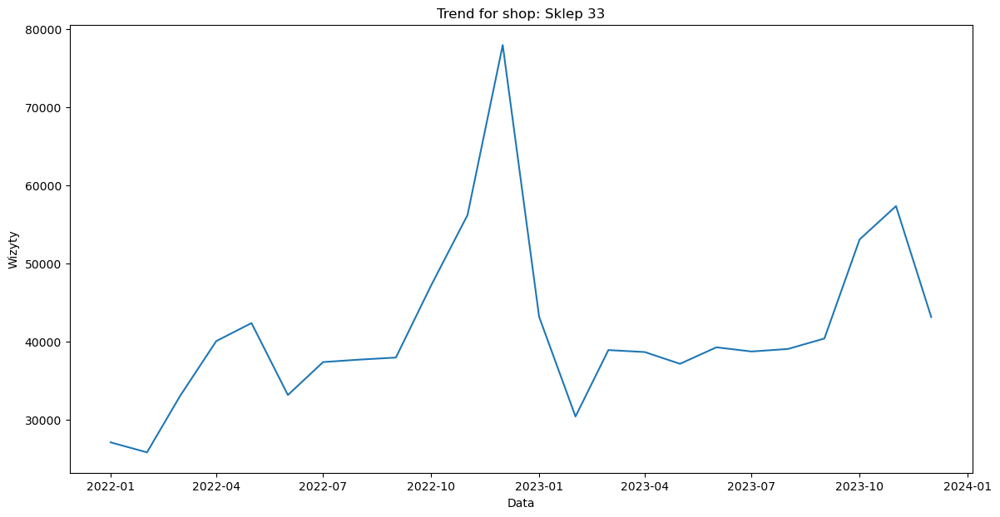

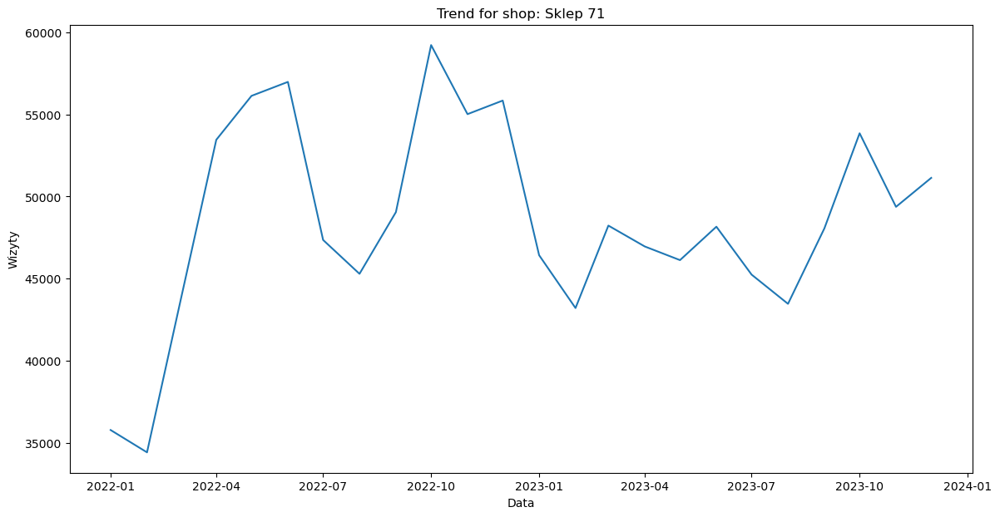

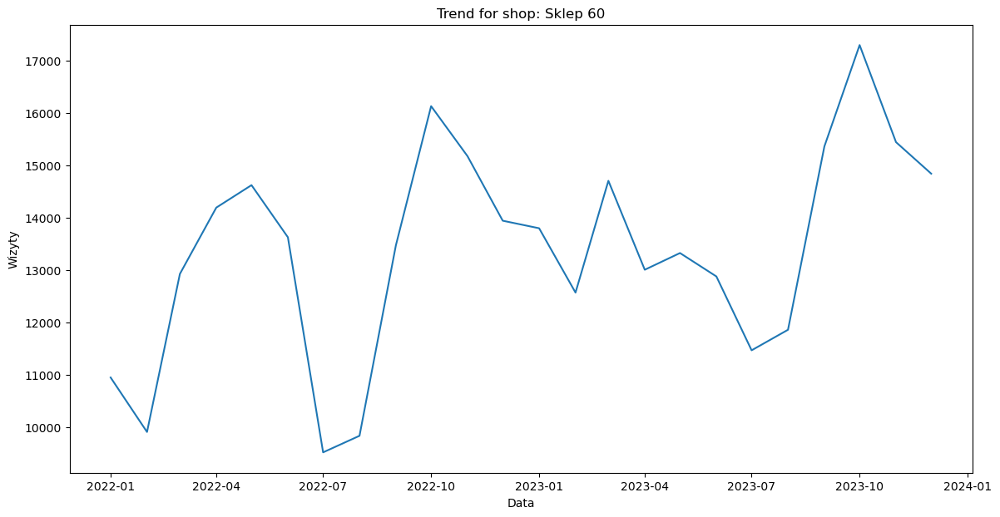

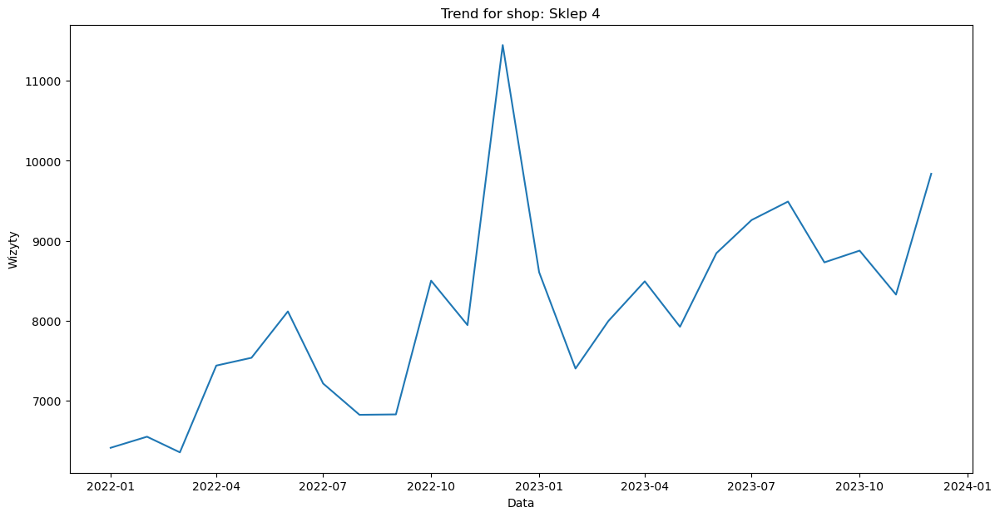

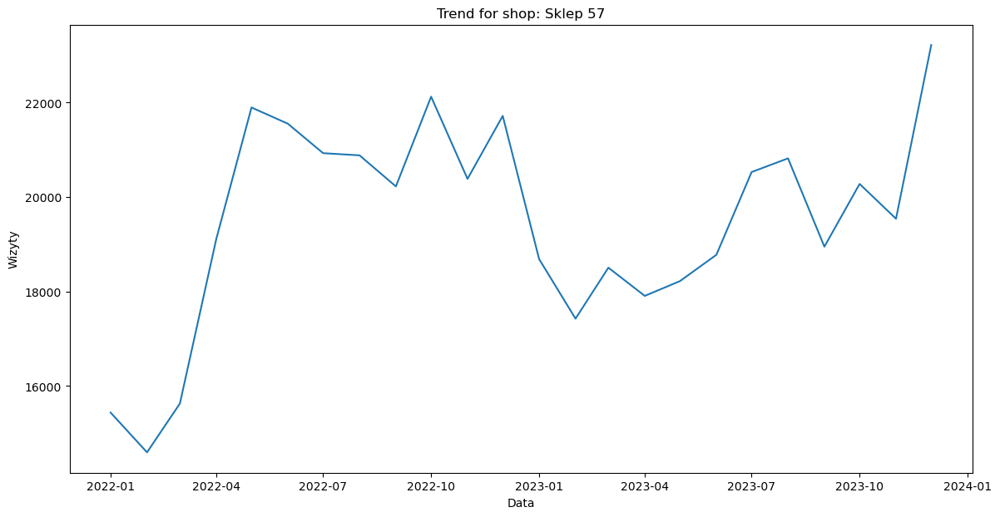

...

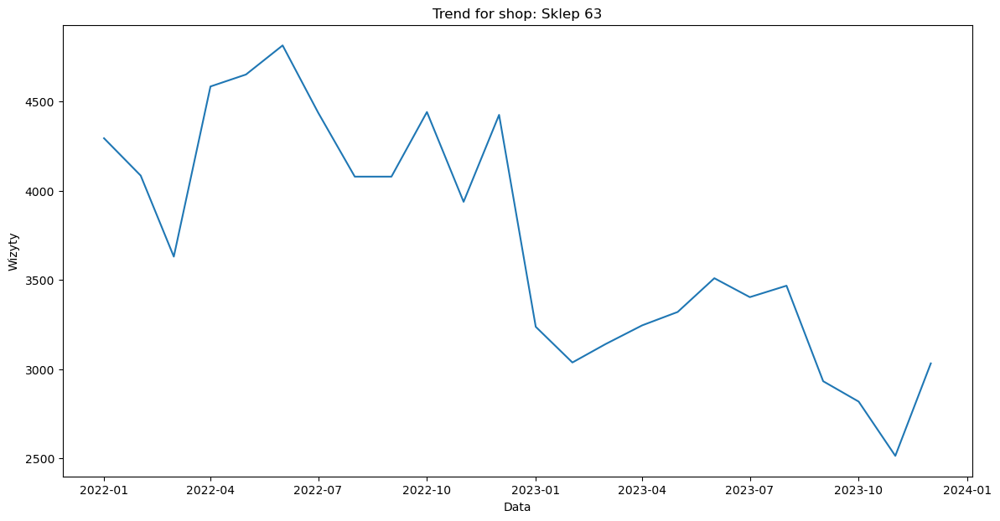

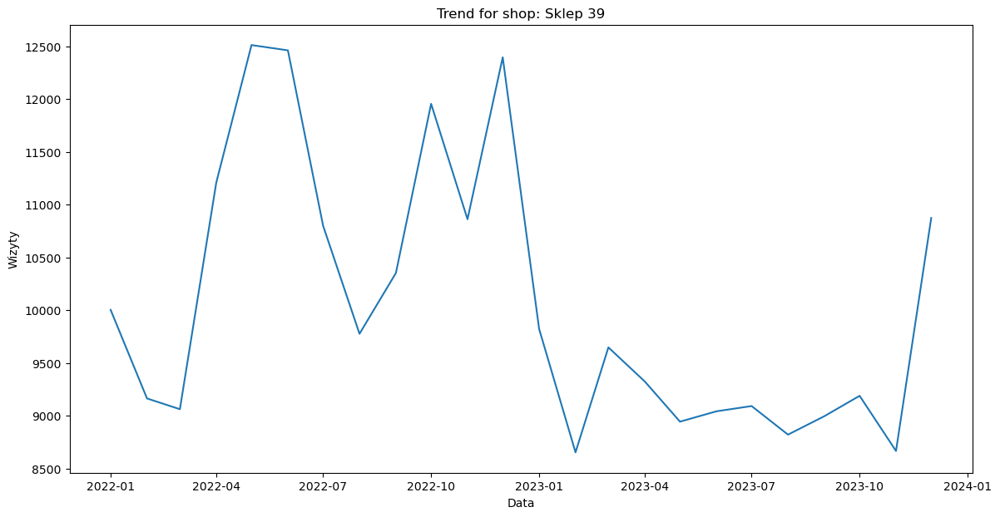

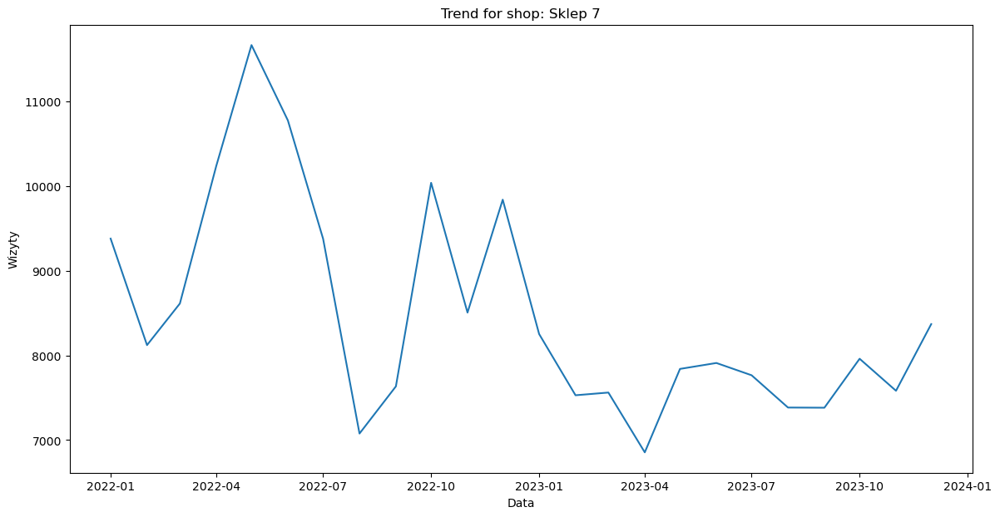

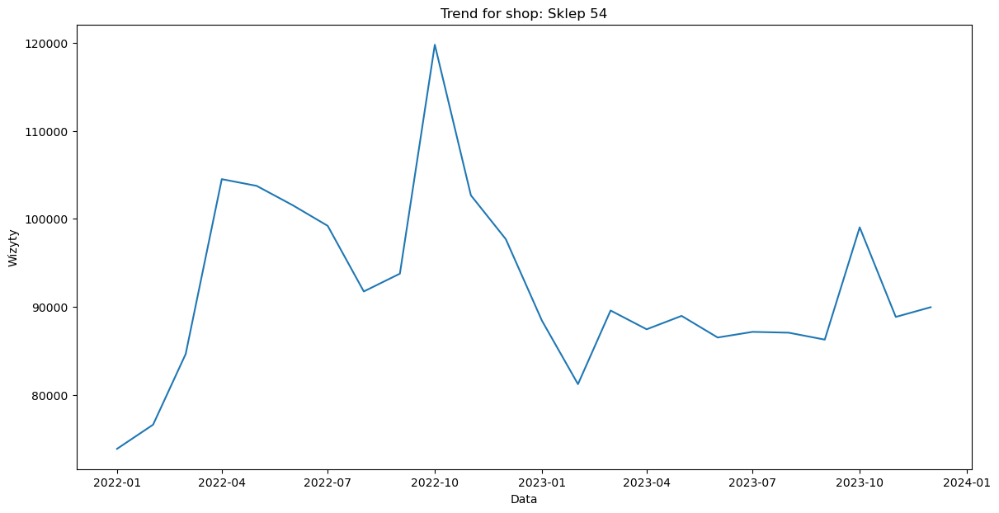

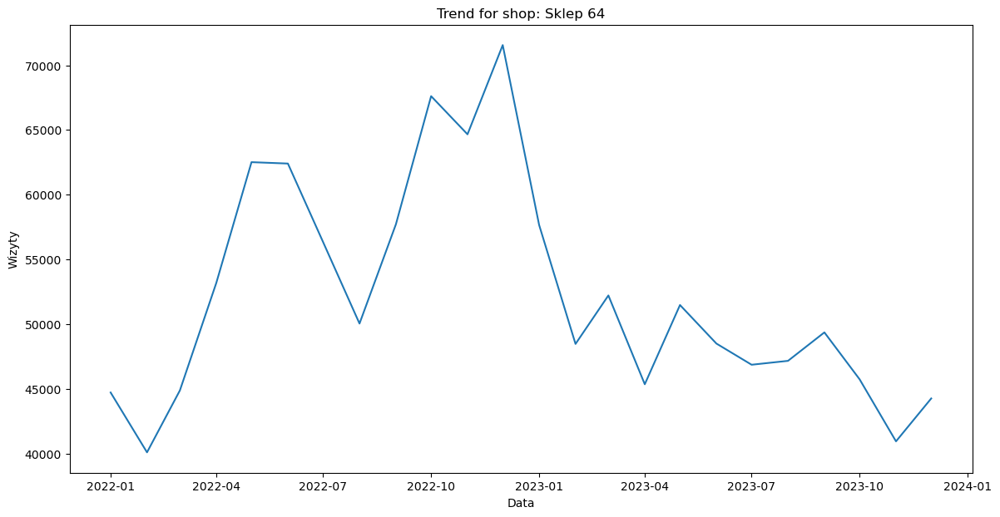

In [12]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats

# Assume 'df' is your DataFrame and it has columns 'shop', 'date' and 'points'
df['Data'] = pd.to_datetime(df['Data'])

# Let's find the trends for each shop
shops = df['Nazwa'].unique()
trends = {}

for shop in shops:
    shop_data = df[df['Nazwa'] == shop]
    shop_data['Data'] = (pd.to_datetime(shop_data['Data']) - pd.to_datetime(min(df['Data']))).dt.days
    slope, intercept, r_value, p_value, std_err = stats.linregress(shop_data['Data'].values, shop_data['Wizyty'].values)
    trends[shop] = slope

# Sort shops by trends
sorted_shops = sorted(trends, key=trends.get, reverse=True)

# Now lets create a line plot for each shop
for shop in sorted_shops:
    shop_data = df[df['Nazwa'] == shop]
    plt.figure(figsize=(14, 7))
    sns.lineplot(data=shop_data, x='Data', y='Wizyty')
    plt.title(f"Trend for shop: {shop}")
    plt.show()


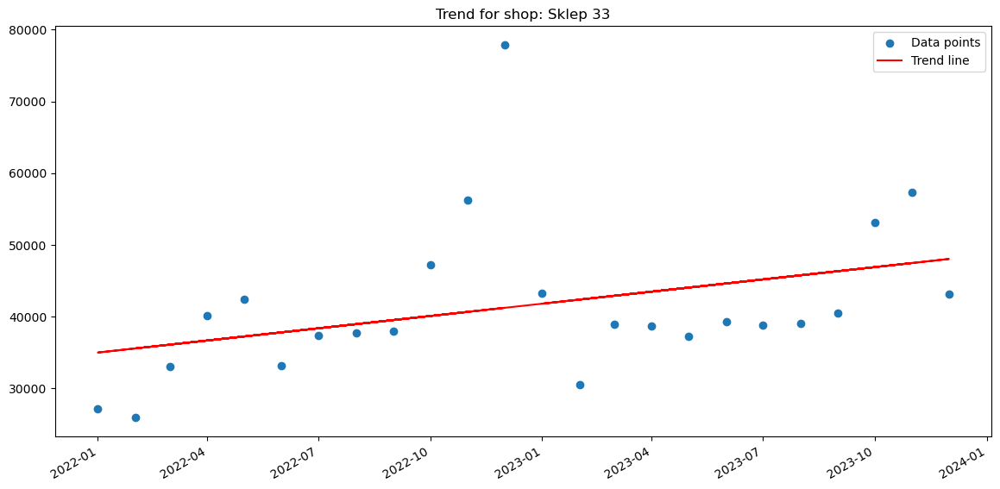

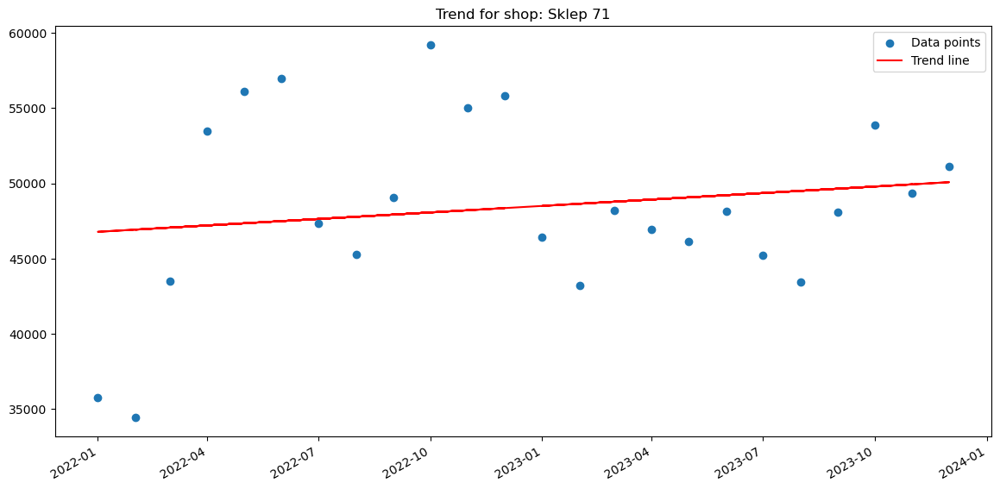

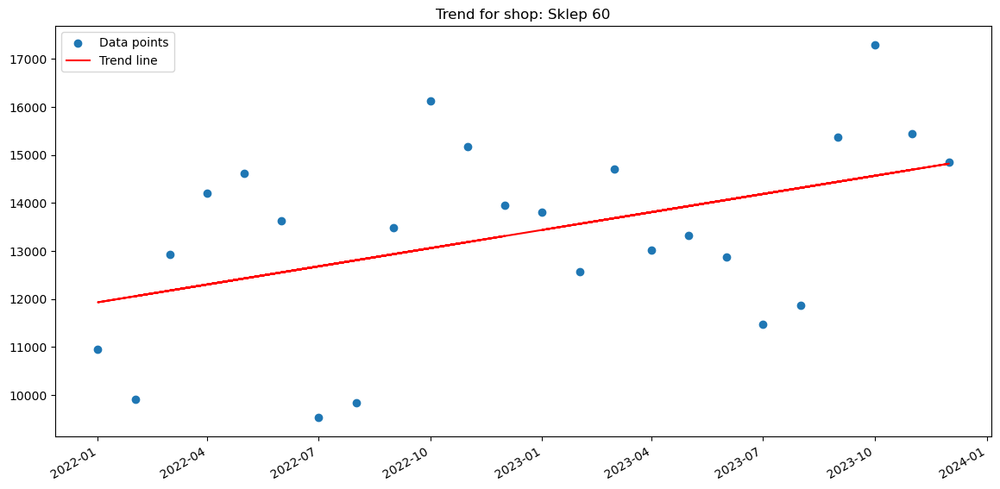

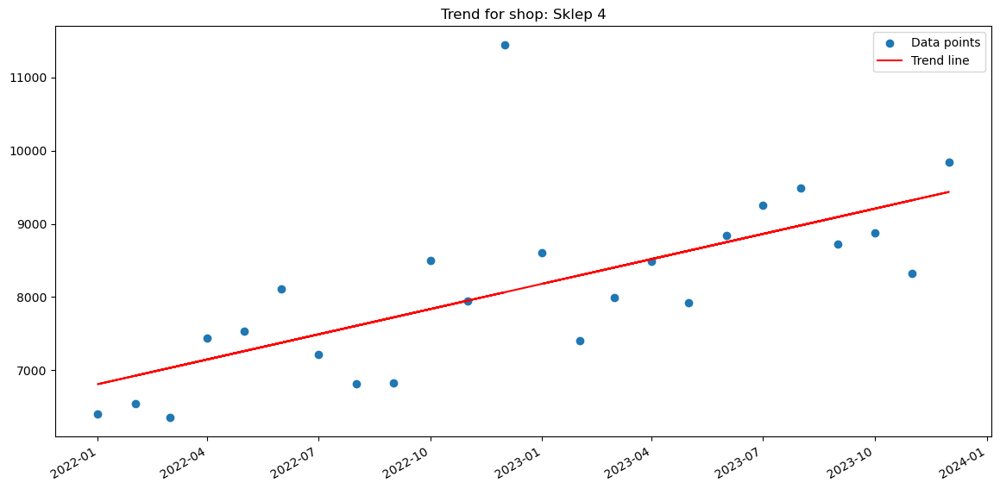

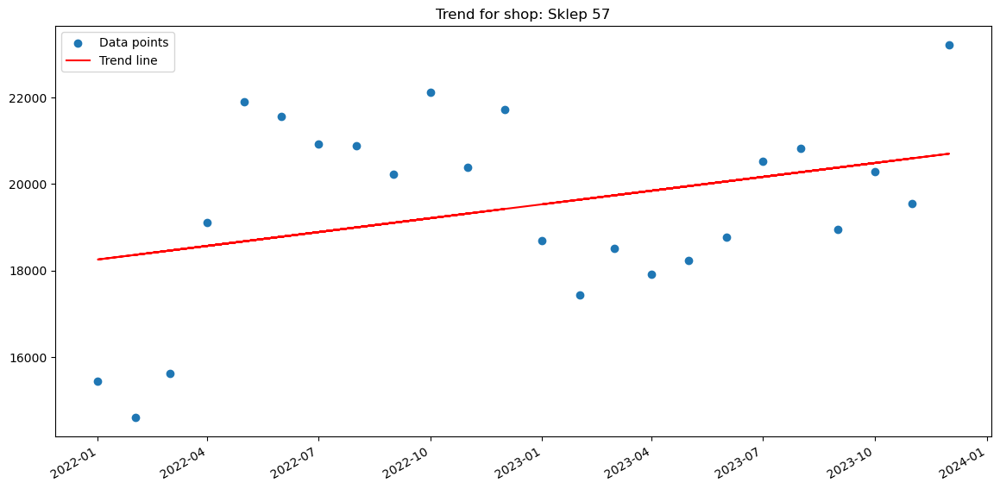

...

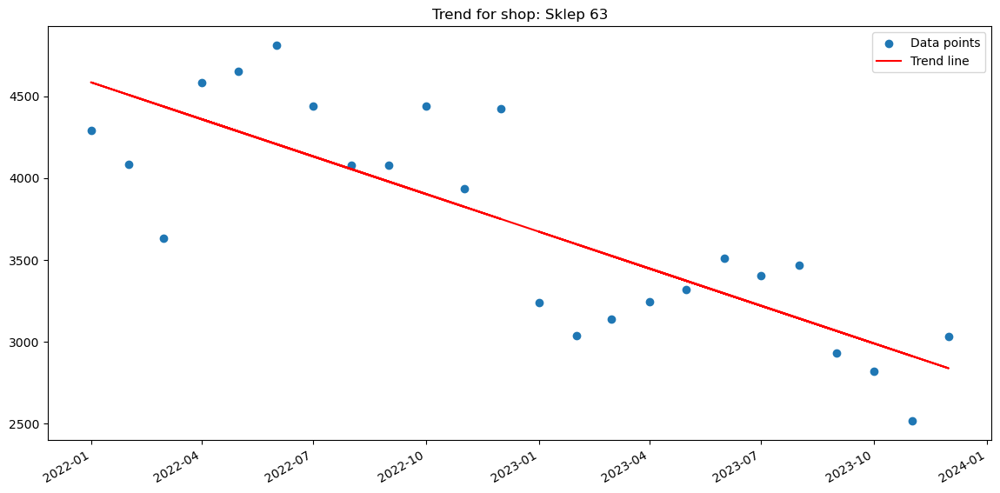

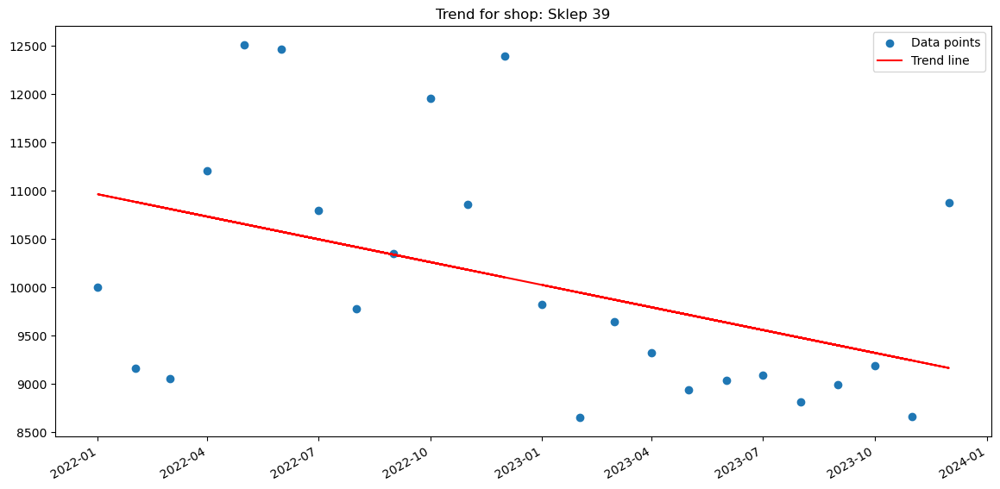

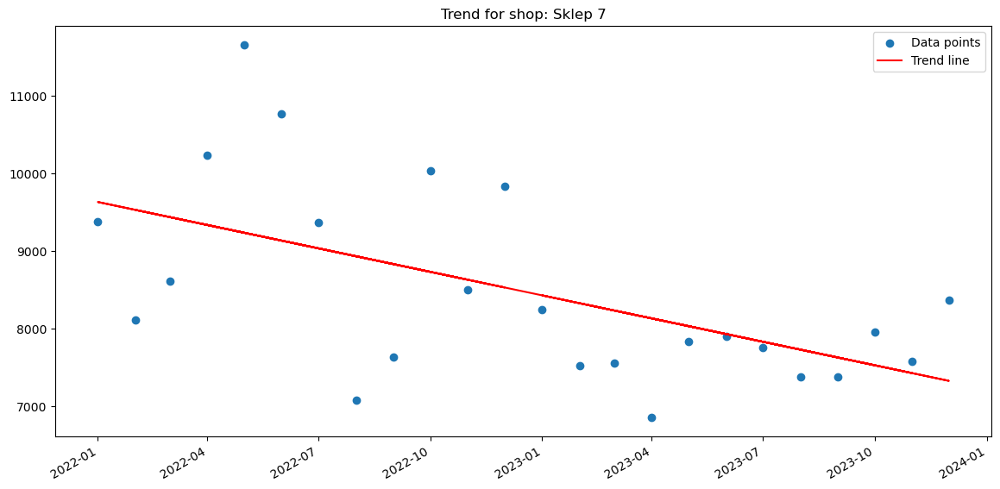

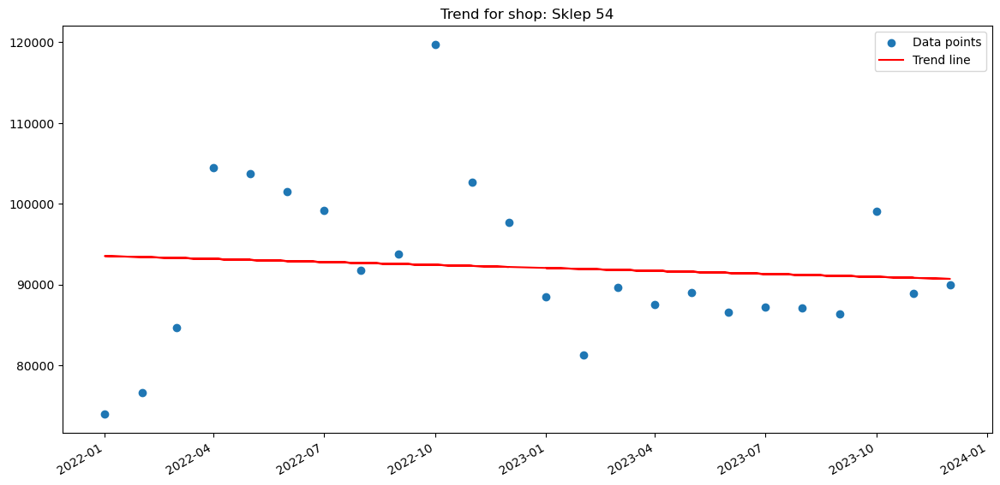

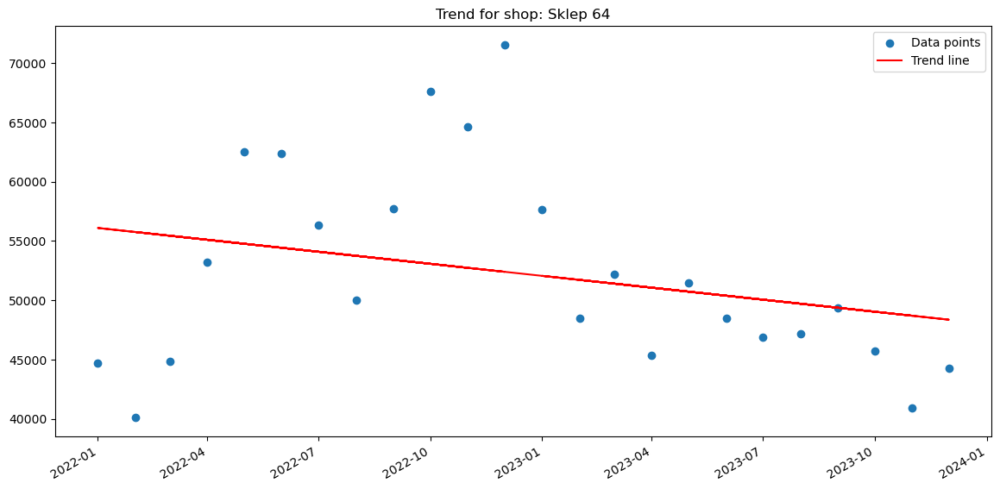

In [13]:
import matplotlib.dates as mdates

for shop in sorted_shops:
    shop_data = df[df['Nazwa'] == shop]

    # Filter out data from 2024 or later
    shop_data = shop_data[shop_data['Data'] < '2024-01-01']
    
    # Convert dates to numerical form for linear regression
    shop_data_numerical = (pd.to_datetime(shop_data['Data']) - pd.to_datetime(min(df['Data']))).dt.days
    
    # Linear regression
    slope, intercept, r_value, p_value, std_err = stats.linregress(shop_data_numerical, shop_data['Wizyty'])

    # Scatter plot
    plt.figure(figsize=(14, 7))
    plt.scatter(shop_data['Data'].values, shop_data['Wizyty'].values, label='Data points')
    plt.title(f"Trend for shop: {shop}")

    # Trend line
    trendline = intercept + (slope * shop_data_numerical)
    plt.plot(shop_data['Data'].values, trendline , 'r', label='Trend line')
    
    plt.legend()
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
    plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=3))
    plt.gcf().autofmt_xdate()
    plt.show()


In [16]:
trends

{'Sklep 62': 1.2621107656680561,
 'Sklep 63': -2.4999379706243916,
 'Sklep 64': -11.067061273745034,
 'Sklep 65': -1.3346428423739582,
 'Sklep 1': -0.4938863471464608,
 'Sklep 2': -0.8612694217734388,
 'Sklep 3': 0.16050100938711223,
 'Sklep 4': 3.7569679665266933,
 'Sklep 5': -0.9524873779619027,
 'Sklep 6': -0.18336635301105628,
 'Sklep 7': -3.2963321842234863,
 'Sklep 8': 0.48135077423938966,
 'Sklep 9': -0.46888005022499735,
 'Sklep 10': -0.19413220903523645,
 'Sklep 21': -0.4497477472058586,
 'Sklep 22': -0.5366415040431876,
 'Sklep 11': -0.39408390130938376,
 'Sklep 12': -0.9819908046149856,
 'Sklep 13': 0.7729424104239425,
 'Sklep 14': 0.09406190907621344,
 'Sklep 15': 0.15621628327500064,
 'Sklep 16': 1.6330755668169157,
 'Sklep 17': 0.049818047164881606,
 'Sklep 18': -1.190625669635305,
 'Sklep 19': -0.3409501020665181,
 'Sklep 20': 1.1726822629819966,
 'Sklep 66': -0.26036454476077336,
 'Sklep 67': -0.4997659800829314,
 'Sklep 68': 0.14915715236294322,
 'Sklep 69': -0.7919835

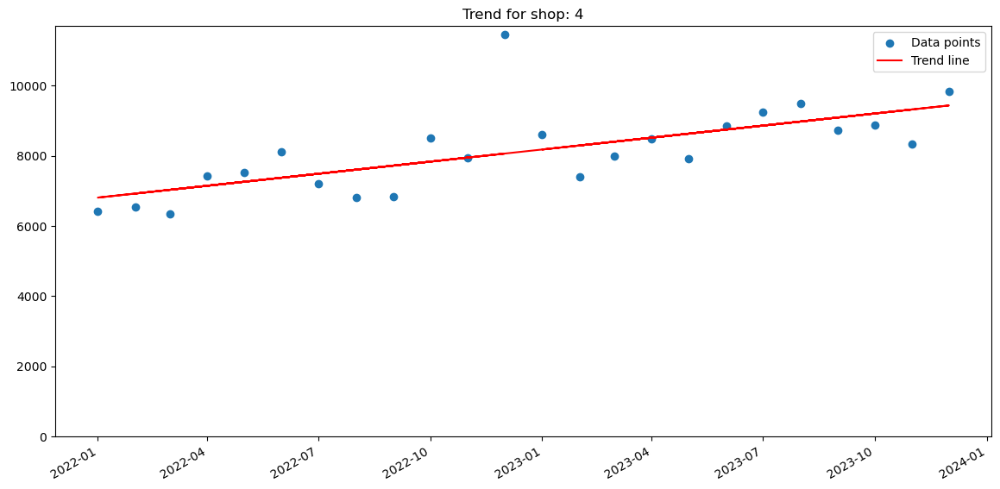

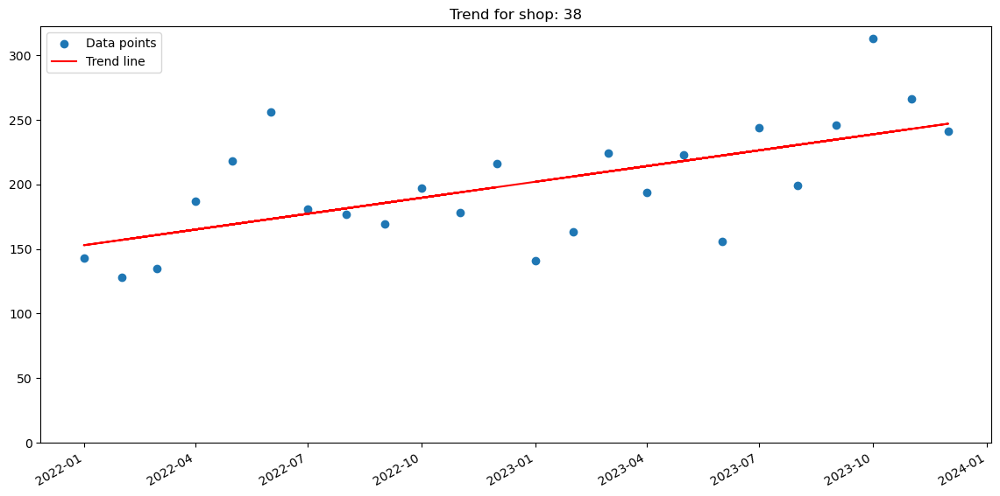

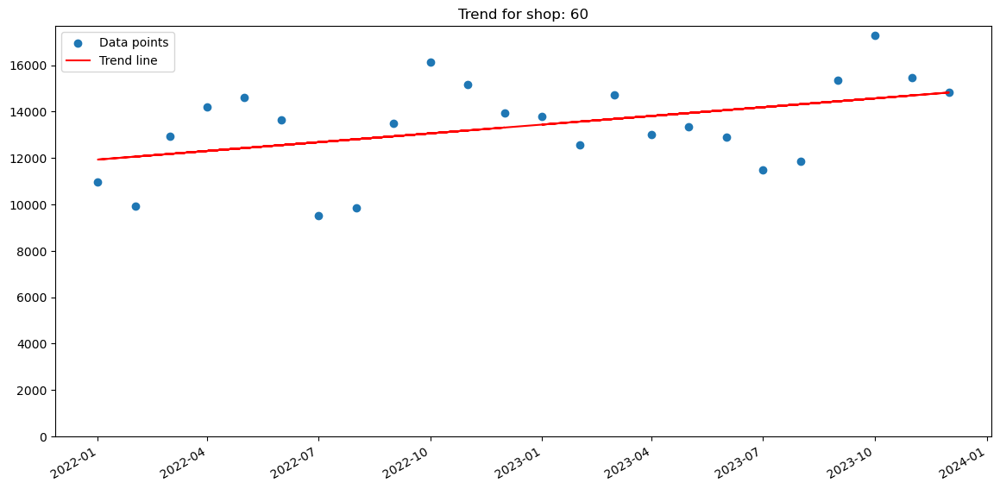

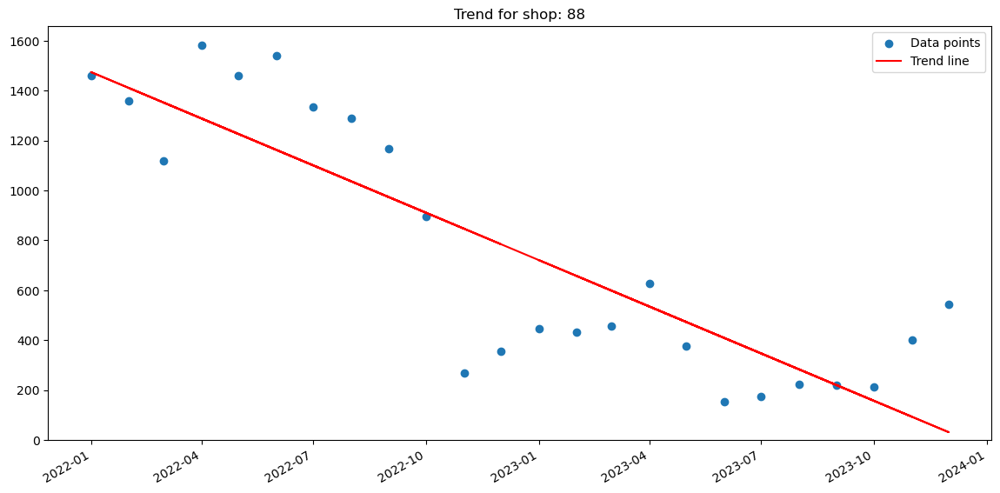

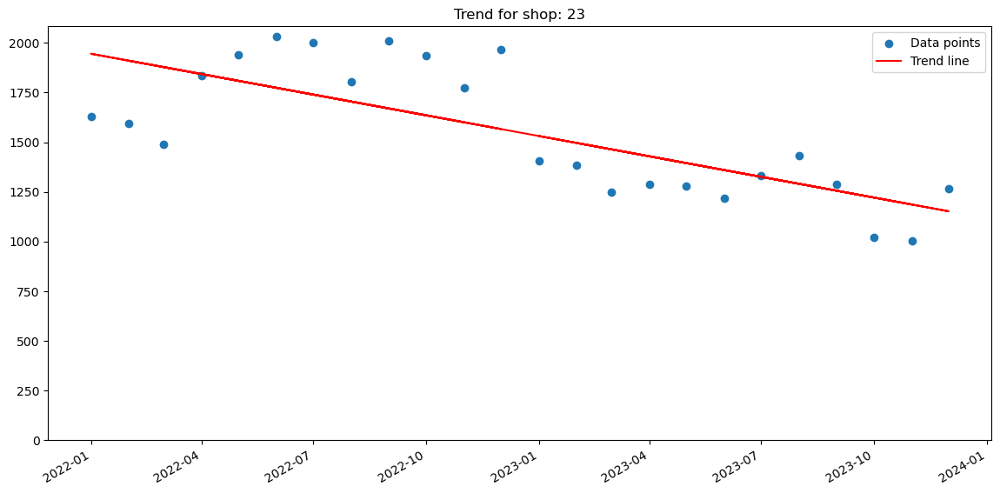

...

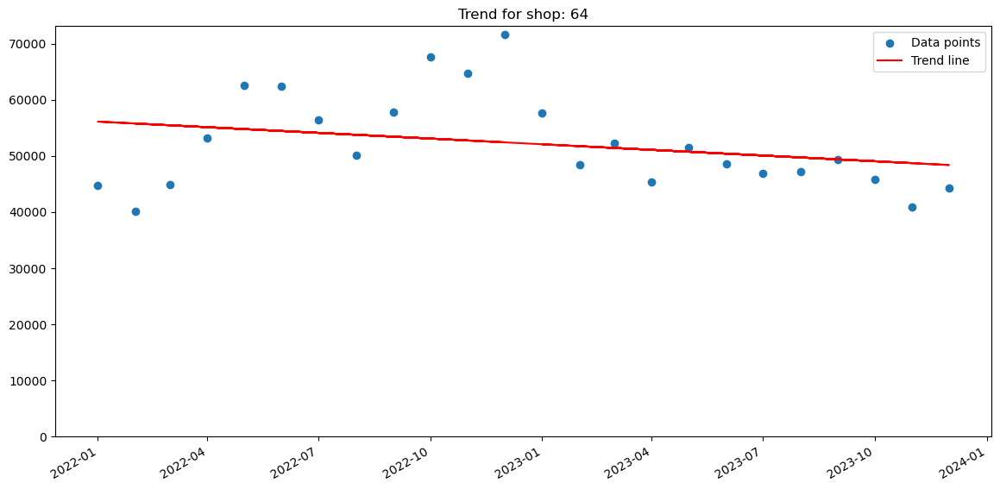

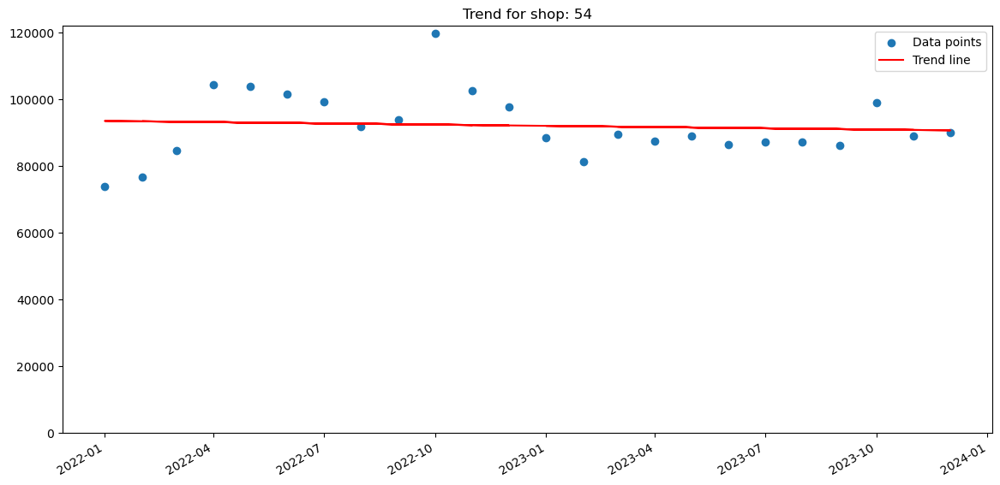

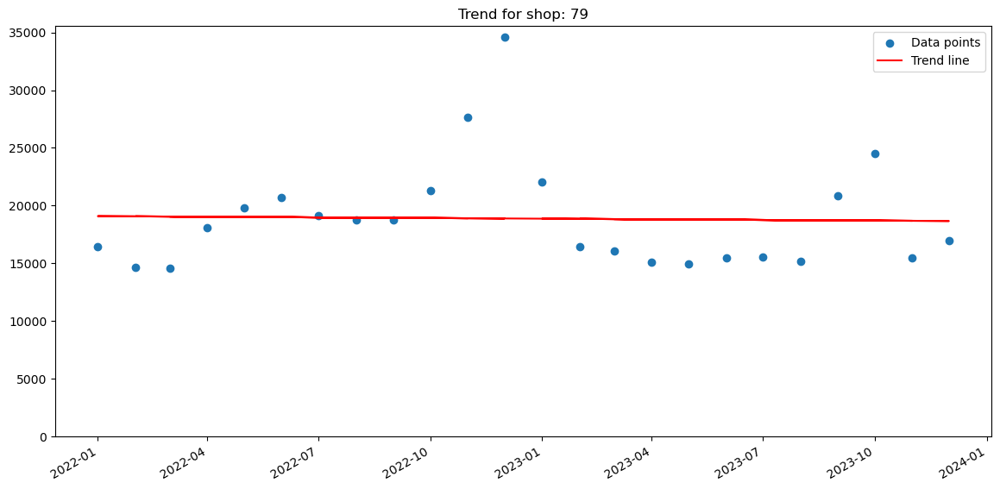

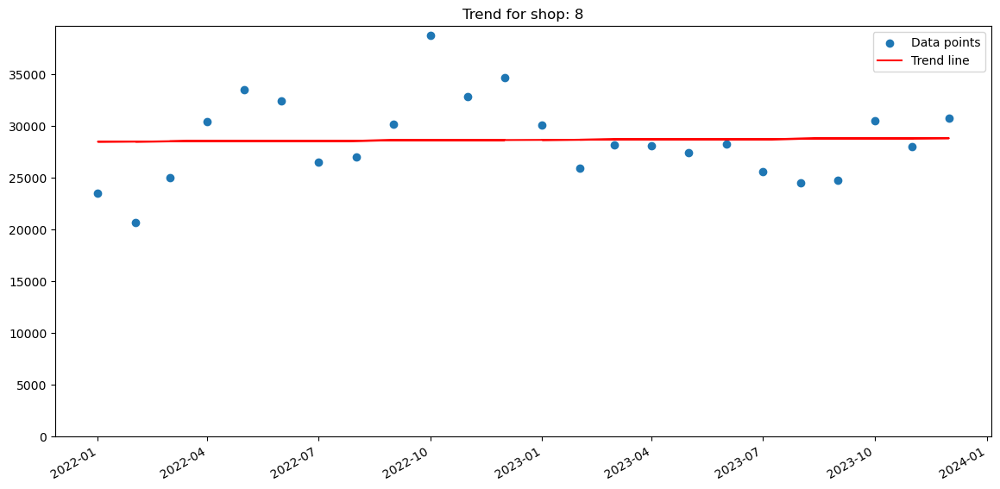

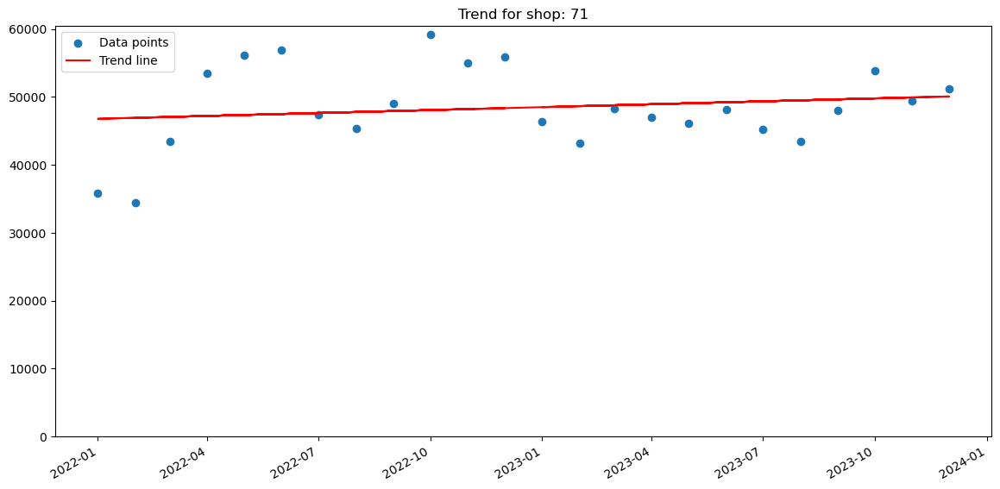

In [22]:
import matplotlib.dates as mdates

selected_shops = [4, 38, 60, 88, 23, 51, 75, 84, 33, 64, 54, 79, 8, 71]

for shop in selected_shops:
    shop_data = df[df['Nazwa'] == f"Sklep {shop}"]

    # Filter out data from 2024 or later
    shop_data = shop_data[shop_data['Data'] < '2024-01-01']

    if len(shop_data) > 0:  # Add this line to check if data is present for the shop
        # Convert dates to numerical form for linear regression
        shop_data_numerical = (pd.to_datetime(shop_data['Data']) - pd.to_datetime(min(df['Data']))).dt.days

        # Linear regression
        slope, intercept, r_value, p_value, std_err = stats.linregress(shop_data_numerical, shop_data['Wizyty'])

        # Scatter plot
        plt.figure(figsize=(14, 7))
        plt.scatter(shop_data['Data'].values, shop_data['Wizyty'].values, label='Data points')
        plt.title(f"Trend for shop: {shop}")

        # Trend line
        trendline = intercept + (slope * shop_data_numerical)
        plt.plot(shop_data['Data'].values, trendline , 'r', label='Trend line')
        plt.ylim(bottom=0)
        plt.legend()
        plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
        plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=3))
        plt.gcf().autofmt_xdate()
        plt.show()

    else:
        print(f"No data available for shop: {shop}")


In [20]:
print("Rows for Shop 4:", len(df[df['Nazwa'] == '4']))


Rows for Shop 4: 0


In [23]:
# Convert 'Data' column to datetime object if it's not
df['Data'] = pd.to_datetime(df['Data'])

# Set 'Data' as index to perform date operations
df = df.set_index('Data')

# Calculate sum of 'Wizyty' for 2022 and 2023 by 'Nazwa'
data_2022 = df[df.index.year == 2022].groupby('Nazwa')['Wizyty'].sum()
data_2023 = df[df.index.year == 2023].groupby('Nazwa')['Wizyty'].sum()

# Calculate percentage difference from 2022 to 2023 for each 'Nazwa'
percentage_difference = ((data_2023 - data_2022) / data_2022) * 100

# Reset index to move 'Nazwa' from index to column
percentage_difference = percentage_difference.reset_index()
